# Twitter Analysis 

# Setup

# Sentiment Analysis

In [43]:
import re
from textblob import TextBlob
from load_pickle import df_trump_tweets as tt, df_trump_replies as tr, df_elon_tweets as et, df_elon_replies as er
import plotly.plotly as py
import plotly.graph_objs as go

#list_collections = ['trump_tweets','trump_replies','elon_tweets','elon_replies']

In [74]:
import plotly
#plotly.tools.set_credentials_file(username='sonali18317', api_key='AztkaqxkMkq2bQ1n6rL2')
plotly.tools.set_credentials_file(username='yopechenga', api_key='5vh9jlqPkXatKDOBmTQp')

In [41]:
trace0 = go.Scatter(
    x = tt['polarity'],
    y = tt['subjectivity'],
    name = 'Tweets',
    mode = 'markers',
    marker = dict(
        size = 10,
        colorscale='Viridis',
        line = dict(
            width = 2,
            color = 'rgb(0, 0, 0)'
        )
    )
)

trace1 = go.Scatter(
    x = tr['polarity'],
    y = tr['subjectivity'],
    name = 'Replies',
    mode = 'markers',
    marker = dict(
        size = 10,
        color = 'rgba(255, 182, 193, .8)',
        line = dict(
            width = 2,
        )
    )
)

data = [trace0, trace1]

layout = dict(title = 'Sentiment analysis of Trump tweets',
              yaxis = dict(zeroline = False, title='Subjectivity'),
              xaxis = dict(zeroline = False, title = 'Polarity'),
             )

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)



In [62]:
trace0 = go.Scatter(
    x = et['polarity'],
    y = et['subjectivity'],
    name = 'Tweets',
    mode = 'markers',
    marker = dict(
        size = 10,
        color='rgba(255,191,0)',
        line = dict(
            width = 2,
            color = 'rgb(0, 0, 0)'
        )
    )
)

trace1 = go.Scatter(
    x = er['polarity'],
    y = er['subjectivity'],
    name = 'Replies',
    mode = 'markers',
    marker = dict(
        size = 10,
        color = 'rgba(204, 215, 10, .8)',
        line = dict(
            width = 2,
        )
    )
)

data = [trace0, trace1]

layout = dict(title = 'Sentiment analysis of Elon Musk tweets',
              yaxis = dict(zeroline = False, title='Subjectivity'),
              xaxis = dict(zeroline = False, title = 'Polarity'),
             )

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

In [56]:
df=[tt['polarity'],tr['polarity'],et['polarity'],er['polarity']]
sentiment=[]
for d in df:
    p=0
    n=0
    r=0
    for i in d:
        if i>0:
            p+=1
        elif i<0:
            n+=1
        else:
            r+=1
    t=n+r+p
    sentiment.append([p/t*100,n/t*100,r/t*100])


In [58]:
trace1 = go.Bar(
    x=['Positive', 'Neutral', 'Negative'],
    y=[sentiment[0][0], sentiment[0][2], sentiment[0][1]],
    name='Trump Tweets'
)
trace2 = go.Bar(
    x=['Positive', 'Neutral', 'Negative'],
    y=[sentiment[1][0], sentiment[1][2], sentiment[1][1]],
    name='Replies to Trump Tweets'
)

data = [trace1, trace2]
layout = go.Layout(title = 'Sentiment of Trump tweets',
    barmode='group'
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

In [75]:
trace1 = go.Bar(
    x=['Positive', 'Neutral', 'Negative'],
    y=[sentiment[2][0], sentiment[2][2], sentiment[2][1]],
    name='Elon Musk Tweets',
    marker=dict(color='rgb(144, 12, 63,1)'),
)
trace2 = go.Bar(
    x=['Positive', 'Neutral', 'Negative'],
    y=[sentiment[3][0], sentiment[3][2], sentiment[3][1]],
    name='Replies to ELon Tweets',
    marker=dict(color='rgb(255, 195, 0,1)'),
)

data = [trace1, trace2]
layout = go.Layout(title = 'Sentiment of Elon Musk tweets',
    barmode='group'
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

High five! You successfully sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~yopechenga/0 or inside your plot.ly account where it is named 'plot from API'


# Content Analysis

In [86]:
from load_pickle import df_trump_tweets as tt, df_trump_replies as tr, df_elon_tweets as et, df_elon_replies as er
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
%matplotlib inline

In [78]:
tweetListtrump=list(tt['processed_tweet'])+list(tr['processed_tweet'])
tweetlistelon=list(et['processed_tweet'])+list(er['processed_tweet'])
stopwords = set(STOPWORDS)
stopwords.update(["REALDONALDTRUMP",'WILL','ELONMUSK'])
#removed realdonaldtrump as it occurs in every tweet and hence redundant for analysis
def make_text(l):
    text = ' '
    for val in l:
        # separate words
        tokens = val.split() 
        # Converts every word into UPPERCASE
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].upper() 
        for words in tokens: 
            text = text + words + ' '
    return text

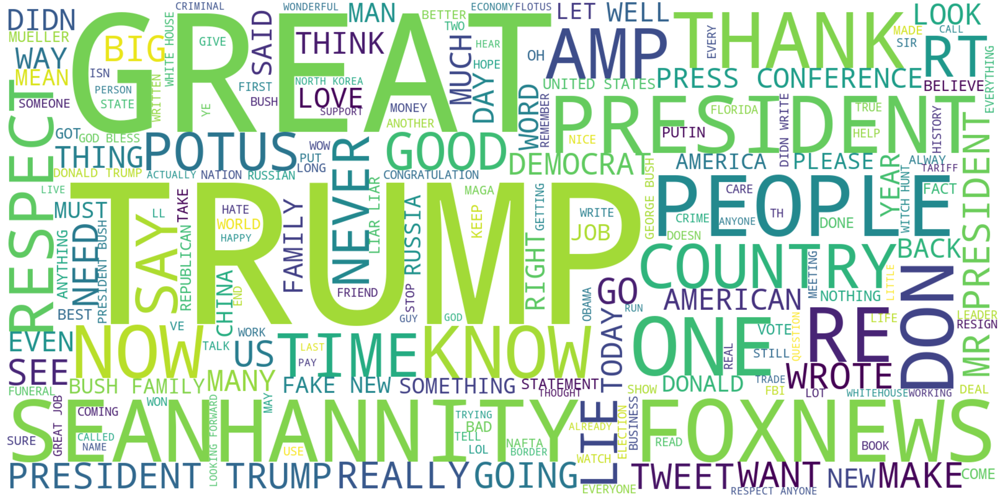

In [92]:
#Word cloud for Trump
text1=make_text(tweetListtrump)
wordcloud_trump = WordCloud(background_color ='white', stopwords = stopwords, min_font_size = 1,width=1600, height=800).generate(text1)
plt.imshow(wordcloud_trump, interpolation='bilinear') 
plt.axis("off") 
plt.rcParams['figure.figsize'] = [200, 50]
plt.show() 

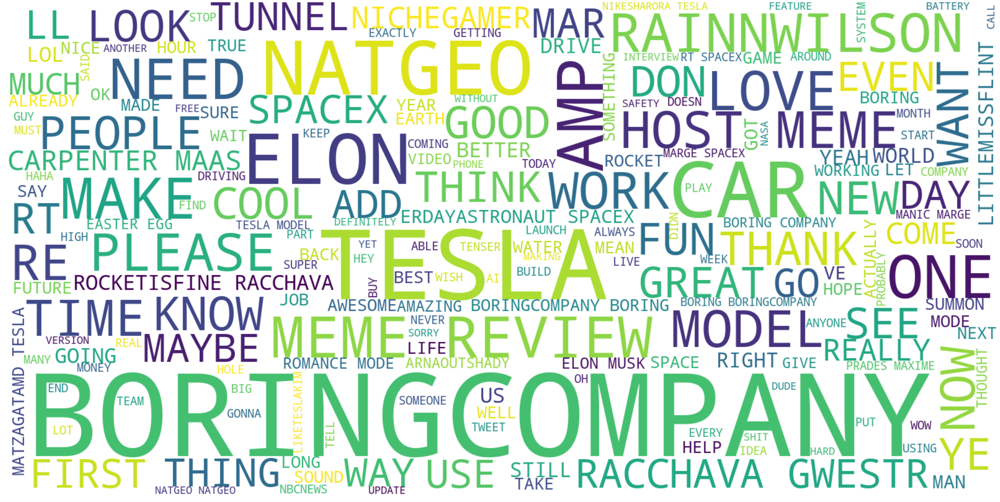

In [91]:
#Word cloud for Elon Musk
text2=make_text(tweetlistelon)
wordcloud_elon = WordCloud(background_color ='white', stopwords = stopwords, min_font_size = 1,width=1600, height=800).generate(text2)
plt.imshow(wordcloud_elon, interpolation='bilinear') 
plt.axis("off") 
plt.rcParams['figure.figsize'] = [200, 50]
plt.show()

# Temporal analysis

In [124]:
import plotly.plotly as py
import plotly.graph_objs as go 
from dateutil.parser import parse

def get_time_occurance(l):
    date_dict={}
    for d in l:
        d=parse(d)
        d=d.strftime('%Y-%m-%d')
        if d not in date_dict:
            date_dict[d]=1
        else:
            date_dict[d]+=1
    return date_dict


In [118]:
def plotdata(d1,d2,title,name1,name2):
   # trace0 = go.Scatter(x=list(d1.keys()),y=list(d1.values()),name=name1,mode='markers',marker = dict(size = 10,color='rgba(255, 195, 0,1)'))
    trace=go.Scatter(x=list(d2.keys()),y=list(d2.values()),name=name2)

    data = [trace]
    layout = dict(
        title=title,
#        xaxis=dict(
#             rangeselector=dict(
#                 buttons=list([
#                     dict(count=1,
#                          label='1m',
#                          step='month',
#                          stepmode='backward'),
#                     dict(count=6,
#                          label='6m',
#                          step='month',
#                          stepmode='backward'),
#                     dict(count=1,
#                         label='YTD',
#                         step='year',
#                         stepmode='todate'),
#                     dict(count=1,
#                         label='1y',
#                         step='year',
#                         stepmode='backward'),
#                     dict(step='all')
#                 ])
#            ),
#             rangeslider=dict(
#                 visible = True
#             ),
#             type='date'
#        )
    )

    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)
    


In [125]:
d1=get_time_occurance(tt['created_at'])
d2=get_time_occurance(tr['created_at'])


In [126]:

import plotly.plotly as py
import plotly.graph_objs as go

#import pandas as pd

#df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/finance-charts-apple.csv")
d1=get_time_occurance(tt['created_at'])
d2=get_time_occurance(tr['created_at'])
trace_high = go.Scatter(
    x=list(d1.keys()),
    y=list(d1.values()),
    name = "AAPL High",
    line = dict(color = '#17BECF'),
    opacity = 0.8)

trace_low = go.Scatter(
    x=list(d2.keys()),
    y=list(d1.values()),
    name = "AAPL Low",
    line = dict(color = '#7F7F7F'),
    opacity = 0.8)

data = [trace_high,trace_low]

layout = dict(
    title='Time Series with Rangeslider',
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    )
)

fig = dict(data=data, layout=layout)
py.iplot(fig, filename = "Time Series with Rangeslider")


In [120]:
d1=get_time_occurance(tt['created_at'])
d2=get_time_occurance(tr['created_at'])
plotdata(d1,d2,'Temporal analysis of Trump tweets and replies','Tweets','Replies')